## Setup

In [20]:
%load_ext autoreload
%autoreload 2

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import os
import datetime

import functools
import IPython
import IPython.display
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import tensorflow as tf


import glucose_ts

# plot layouts
sns.set_style("whitegrid")
sns.set_context(
    "talk",
    rc={
        "axes.titlesize": 36,
        "axes.labelsize": 36,
        "lines.linewidth": 4,
        "lines.markersize": 10,
        "xtick.labelsize": 30,
        "ytick.labelsize": 30,
        'legend.fontsize': 24,
        'figsize': (20, 20),
    }
)

sns.color_palette("dark")

FIG_DIR = os.path.join(
    os.path.dirname(os.path.dirname(glucose_ts.__file__)),
    'presentations',
    'images'
)

plt.subplots_adjust(wspace=1.5)
DATA_DIR = os.path.join(os.path.dirname(os.path.dirname(glucose_ts.__file__)), 'data')


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<Figure size 432x288 with 0 Axes>

## Load and Normalize the data


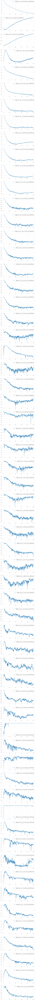

In [4]:

path = '/home/christoph/Downloads/Datenauswertung_COPY/Mehrtagig/Mehrtagige/EXP1'

files = sorted([
    os.path.join(path, one) for one in tuple(os.walk(path))[0][2]
    if one.endswith('xlsx') and one.startswith('Data')
])

fig, axises = plt.subplots(
    len(files),
    1,
    figsize=(20, 10 * len(files))
)

for file_name, ax in zip(files, axises.flatten()):
    
    series = glucose_ts.data.read_glucose_ts(file_name)
    
    ax.plot(range(1000), series.voltages, label=file_name.split('/')[-1])
    ax.legend()


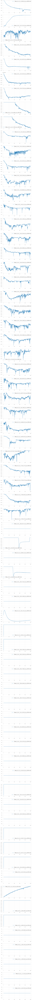

In [3]:

path = '/home/christoph/Downloads/Datenauswertung_COPY/Mehrtagig/Mehrtagige/EXP2'

files = sorted([
    os.path.join(path, one) for one in tuple(os.walk(path))[0][2]
    if one.endswith('xlsx') and one.startswith('Data')
])

fig, axises = plt.subplots(
    len(files),
    1,
    figsize=(20, 10 * len(files))
)

for file_name, ax in zip(files, axises.flatten()):
    
    series = glucose_ts.data.read_glucose_ts(file_name)
    
    ax.plot(range(1000), series.voltages, label=file_name.split('/')[-1])
    ax.legend()


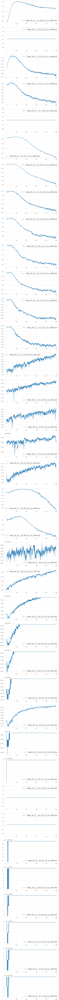

In [4]:

path = '/home/christoph/Downloads/Datenauswertung_COPY/Overnight'

files = sorted([
    os.path.join(path, one) for one in tuple(os.walk(path))[0][2]
    if one.endswith('xlsx') and one.startswith('Data')
])

fig, axises = plt.subplots(
    len(files),
    1,
    figsize=(20, 10 * len(files))
)

for file_name, ax in zip(files, axises.flatten()):
    
    series = glucose_ts.data.read_glucose_ts(file_name)
    
    ax.plot(range(1000), series.voltages, label=file_name.split('/')[-1])
    ax.legend()


NameError: name 'calibration_df' is not defined

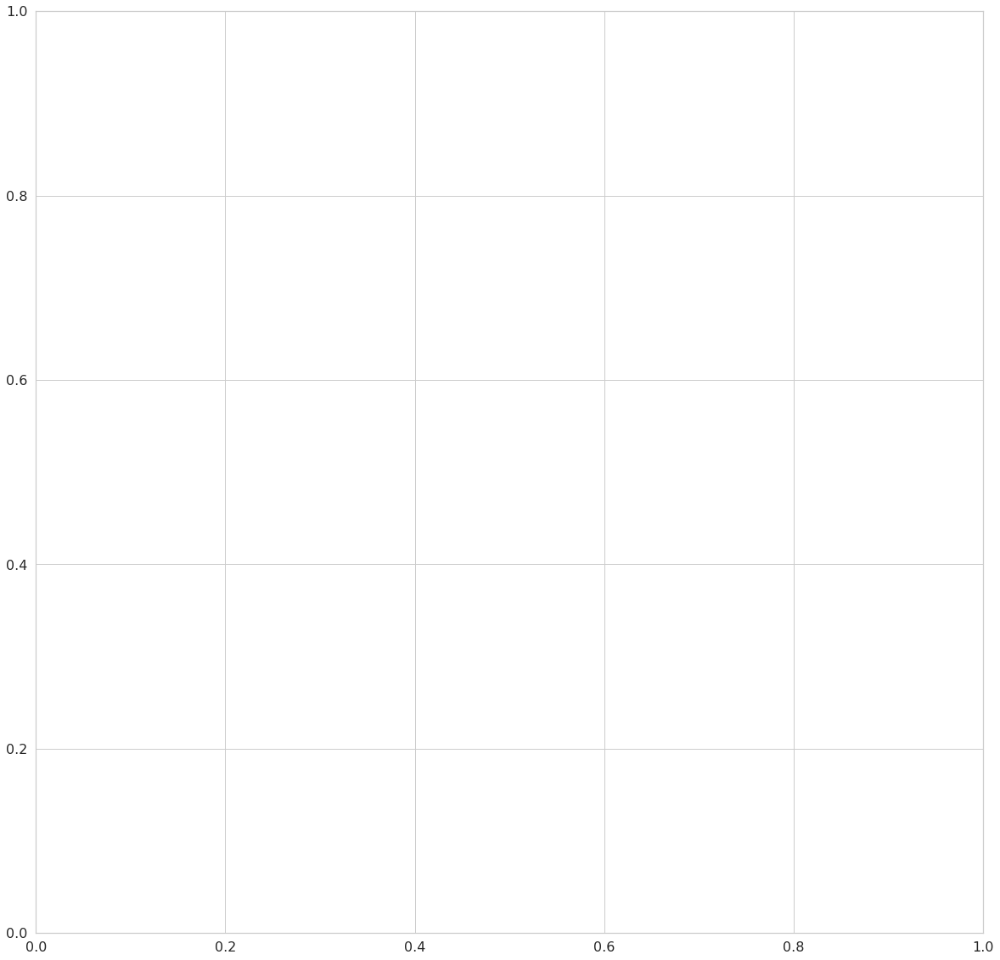

In [5]:
fig, axises = plt.subplots(
    1,
    1,
    figsize=(20, 20)
)

sns.lineplot(
    data=calibration_df[calibration_df['Time'] < datetime.datetime(2020, 12, 12, 18)],
    x='Time',
    y='Value',
    ax=axises,
)

In [81]:

files = [
    '/home/christoph/Downloads/lucas_exp/%s' % one
    for one in os.listdir(
        os.path.join(
            '/home/christoph/Downloads/lucas_exp',
#             'data',
#             'standards_warm',
        ))
    if one.endswith('.xlsx')
]

# for file in files:
#     print(file)
    
#     df = pd.read_excel(file, engine='openpyxl')
#     if df['RealConcentration'].mean() > 10:
#         df['RealConcentration'] = df['RealConcentration'] / 1000.
#     df.to_csv('%s.csv' % file.split('.')[0])


# Standards measure at 37 degree without Lucas

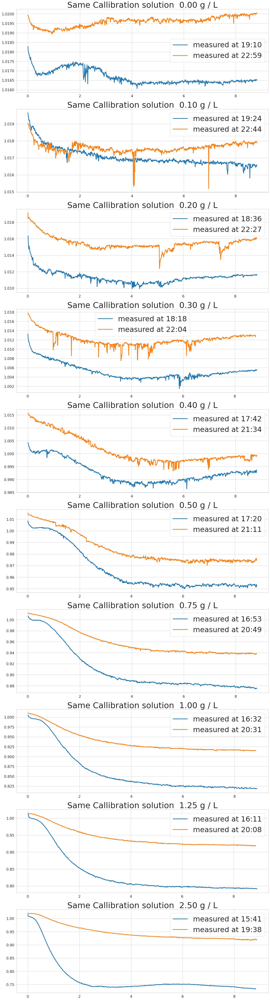

In [26]:
import itertools

series = itertools.groupby(
    sorted(
        [
            glucose_ts.data.read_glucose_ts(
                os.path.join(DATA_DIR, 'standards_warm', one),
                comment=[int(number) for number in one.split('__')[1].split('_')[:2]],
            )
            for one in tuple(
                os.walk(
                    os.path.join(DATA_DIR, 'standards_warm')
                )
            )[0][2]
        ],
        key=lambda one: (one.real_concentration, one.comment)
    ),
    key=lambda one: one.real_concentration
)


fig, axises = plt.subplots(
    10,
    1,
    figsize=(20, 80)
)

for (one_concentration, one_group), ax in zip(series, axises.flatten()):
    for one_series in one_group:

        ax.plot(one_series.points_in_time, one_series.voltages, label='measured at %02d:%02d h' % tuple(one_series.comment))
    ax.set_title('Same Callibration solution %5.2f g / L' % one_series.real_concentration)
    ax.legend()

    
fig.savefig(
    os.path.join(FIG_DIR, 'sensor_behavior_over_time.png'),
    facecolor='w',
    edgecolor='w',
    transparent=True,
)

In [12]:
all_curves[0].real_concentration

2.5

In [1]:
import itertools

all_curves = [
    glucose_ts.data.read_glucose_ts(
        os.path.join(DATA_DIR, 'standards_warm', one),
        comment=int(tuple([int(number) for number in one.split('__')[1].split('_')[:2]]) < (19, 25)),
    )
    for one in tuple(
        os.walk(
            os.path.join(DATA_DIR, 'standards_warm')
        )
    )[0][2]
]
zero_one = {
    one.comment: one
    for one in all_curves
    if one.real_concentration == 2.5
}
series = itertools.groupby(
    sorted(
        all_curves,
        key=lambda one: (one.comment, one.real_concentration)
    ),
    key=lambda one: one.comment
)


fig, axises = plt.subplots(
    1,
    2,
    figsize=(30, 15)
)

for (one_concentration, one_group), ax in zip(series, axises.flatten()):
    for one_series in one_group:

        ax.plot(
            one_series.points_in_time,
            one_series.voltages,
            label='%5.2f g / L' % one_series.real_concentration
        )
    ax.set_title('Group Number %s' % (one_series.comment + 1))
    ax.set_ylim(0.72, 1.03)
    ax.legend()

    
fig.savefig(
    os.path.join(FIG_DIR, 'sensors_by_group.png'),
    facecolor='w',
    edgecolor='w',
    transparent=True,
)

NameError: name 'os' is not defined

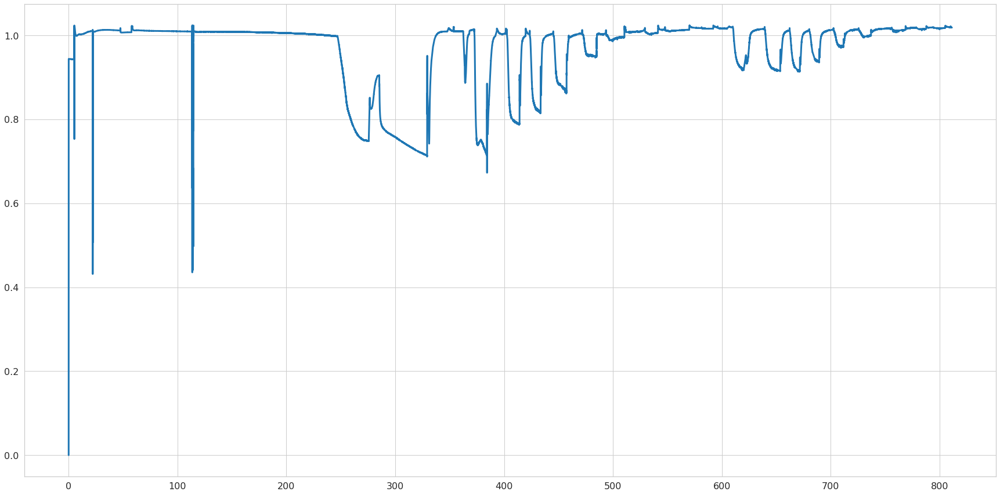

In [51]:
everything = glucose_ts.data.read_glucose_ts(
    os.path.join('/home/christoph/Downloads/AllTimeData.xlsx'),
)


fig, ax = plt.subplots(1, 1, figsize=(30, 15))

ax.plot(
    everything.points_in_time,
    everything.voltages
)

In [ ]:
path = '/home/christoph/Downloads/lucas_exp'



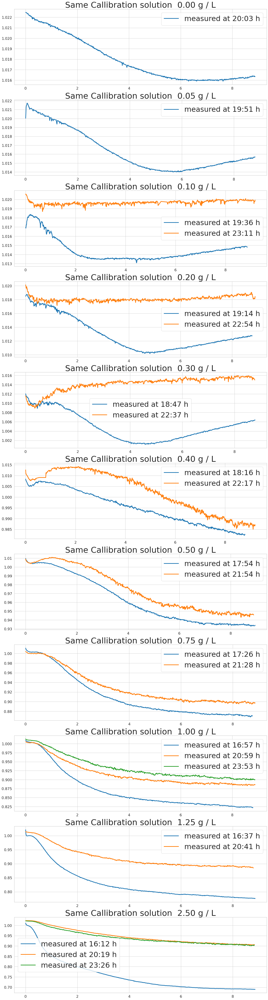

In [84]:
import itertools

series = itertools.groupby(
    sorted(
        [
            glucose_ts.data.read_glucose_ts(
                os.path.join(DATA_DIR, 'warm_standards_hamilton', one),
                comment=[int(number) for number in one.split('__')[1].split('_')[:2]],
            )
            for one in tuple(
                os.walk(
                    os.path.join(DATA_DIR, 'warm_standards_hamilton')
                )
            )[0][2]
            if one.endswith('.csv') and one.startswith('Data_')
        ],
        key=lambda one: (one.real_concentration, one.comment)
    ),
    key=lambda one: one.real_concentration
)


fig, axises = plt.subplots(
    11,
    1,
    figsize=(20, 80)
)

for (one_concentration, one_group), ax in zip(series, axises.flatten()):
    for one_series in one_group:

        ax.plot(one_series.points_in_time, one_series.voltages, label='measured at %02d:%02d h' % tuple(one_series.comment))
    ax.set_title('Same Callibration solution %5.2f g / L' % one_series.real_concentration)
    ax.legend()

    
fig.savefig(
    os.path.join(FIG_DIR, 'sensor_behavior_over_time_2.png'),
    facecolor='w',
    edgecolor='w',
    transparent=True,
)

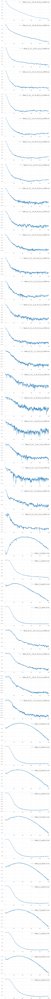

In [3]:

path = DATA_DIR

files = sorted([
    os.path.join(path, one) for one in tuple(os.walk(path))[0][2]
    if one.endswith('.csv') and one.startswith('Data')
])

fig, axises = plt.subplots(
    len(files),
    1,
    figsize=(20, 10 * len(files))
)

for file_name, ax in zip(files, axises.flatten()):
    
    series = glucose_ts.data.read_glucose_ts(file_name)
    
    ax.plot(range(1000), series.voltages, label=file_name.split('/')[-1])
    ax.legend()

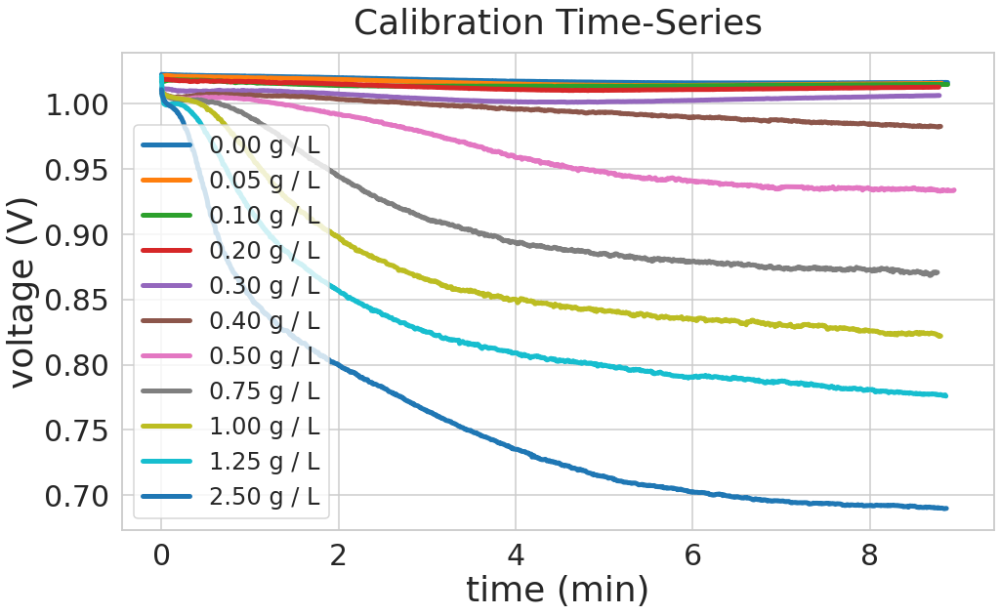

In [18]:
max_time_labeled = (20, 15)
labeled_base_path = os.path.join(DATA_DIR, 'warm_standards_hamilton')


labeled_paths = [
    os.path.join(labeled_base_path, one)
    for one in tuple(os.walk(labeled_base_path))[0][2]
    if tuple([
        int(number) 
        for number in one.split('__')[1].split('_')[:2]
    ]) < max_time_labeled
]

calibration_curves = sorted(
    [
        glucose_ts.data.read_glucose_ts(path)
        for path in labeled_paths
    ],
    key=lambda one: one.real_concentration
)

fig, ax = plt.subplots(1, 1, figsize=(16, 9))

for one_curve in calibration_curves:
    
    ax.plot(
        one_curve.points_in_time,
        one_curve.voltages,
        label='%4.2f g / L' % one_curve.real_concentration,
    )

ax.set_xlabel('time (min)')
ax.set_ylabel('voltage (V)')

ax.set_title('Calibration Time-Series', pad=20)
ax.legend()

fig.savefig(
    os.path.join(
        FIG_DIR,
        'calibration_time_series_sensor3.png'
    ),
    transparent=True,
)


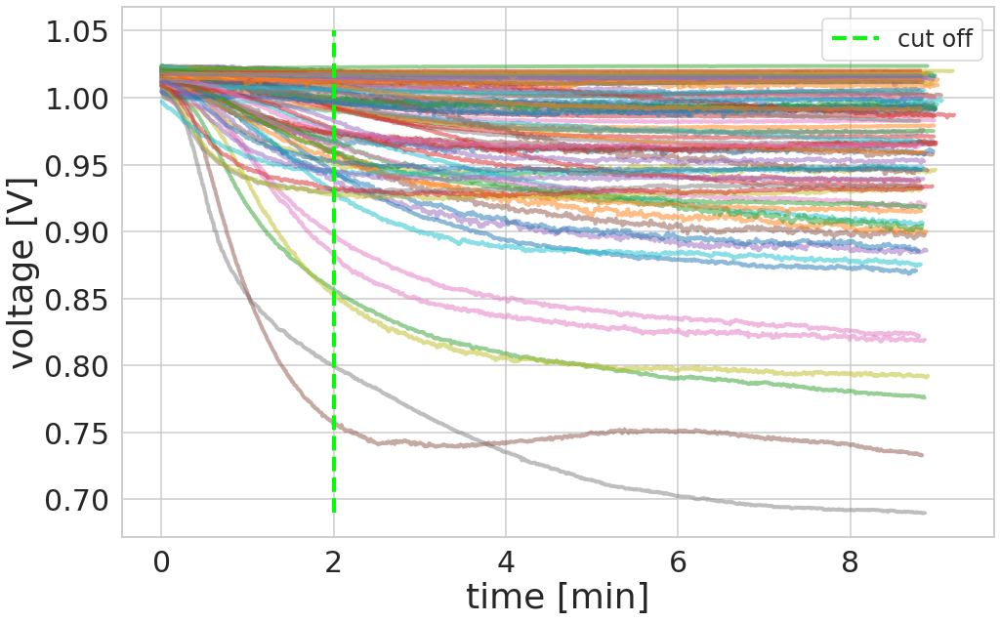

In [31]:
all_paths = [
    os.path.join(prefix, file)
    for prefix, _, files in os.walk(DATA_DIR)
    for file in files
]

glucose_series = [
    glucose_ts.data.read_glucose_ts(path)
    for path in all_paths
]


fig, ax = plt.subplots(
    1,
    1,
    figsize=(16, 10)
)


for series in glucose_series:   
    
    ax.set_ylabel('voltage [V]')
    ax.set_xlabel('time [min]')

    ax.plot(
        series.points_in_time,
        series.voltages,
        alpha=0.5,
        zorder=1,
    )
    
ax.vlines(x=2, ymin=0.69, ymax=1.05, colors='lime', linestyles='dashed', label='cut off', zorder=2)
ax.legend()
fig.savefig(os.path.join(os.path.dirname(os.path.dirname(glucose_ts.__file__)), 'presentations', 'images', 'time_series_dataset.png'), transparent=True)